# OPAL - OPAL-X comparison


## Load the Accelerated.stat file

In [1]:
import sys
sys.path.append('/psi/home/adelmann/git/pyOPALTools')
import numpy as np
from opal import load_dataset

import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import ipywidgets as widgets
from IPython.display import display
import re
%matplotlib notebook

## Set the plotting style

In [2]:
from opal.visualization.styles import load_style

load_style('jupyter')

## Setup helpers 

In [3]:
def visualize_integrated_scalar_field_3d_disc(file_path, title):
    # Read the data from the file
    df = pd.read_csv(file_path, delim_whitespace=True, comment='#', header=None, skiprows=3, names=['i', 'j', 'k', 'x', 'y', 'z', 'rho'])
    
    # Group by i and j, and integrate phi over k
    df_grouped = df.groupby(['i', 'j']).apply(lambda g: np.trapz(g['rho'], g['k']))
    df_grouped = df_grouped.reset_index(name='rho_integrated')
    
    # Extracting indices and integrated phi values
    i = df_grouped['i'].values
    j = df_grouped['j'].values
    phi_integrated = df_grouped['rho_integrated'].values
    
    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    sc = ax.scatter(i, j, phi_integrated, c=phi_integrated, cmap='viridis', marker='o')
    
    # Adding color bar to indicate the scalar field values
    cbar = plt.colorbar(sc)
    cbar.set_label('Integrated quantity')
    
    # Set labels for the axes
    ax.set_xlabel('i')
    ax.set_ylabel('j')
    #ax.set_zlabel('Integrated quantity',labelpad=10)
    
    ax.set_title(title)
    
    plt.show()
    return sum(phi_integrated)

In [4]:
def extract_origin_and_h(fn):
    
    with open(fn, 'r') as file:
        file.readline()  # Skip the first line
        header = file.readline().strip()
    
    # Define regular expressions to extract origin and h
        
    origin_pattern = r'origin=\s*\(\s*(-?\d+\.\d+)\s*,\s*(-?\d+\.\d+)\s*,\s*(-?\d+\.\d+)\s*\)'
    h_pattern = r'h=\s*\(\s*(-?\d+\.\d+)\s*,\s*(-?\d+\.\d+)\s*,\s*(-?\d+\.\d+)\s*\)'
    
    # Search for the patterns in the header
    origin_match = re.search(origin_pattern, header)
    h_match = re.search(h_pattern, header)
    
    if origin_match and h_match:
        origin = tuple(map(float, origin_match.groups()))
        h = tuple(map(float, h_match.groups()))
        
        return {
            'origin': origin,
            'h': h
        }
    else:
        raise ValueError("Header format is incorrect or missing required values")

# OPAL and OPALX data directories on Merlin

In [6]:
opaldir  = '/psi/home/adelmann/git/opal-src-4-opalx-debug/input-files/'
opalxdir = '/psi/home/adelmann/opal-x/downloads/opal-x/input-files/'

# OPAL fields

In [7]:
opalGtrfn    = opaldir + 'Drift-0-grntr_scalar-000000.dat'
opalrho2fn   = opaldir + 'Drift-0-rhs2_scalar-000000.dat'
opalrho2trfn = opaldir + 'Drift-0-rhs2tr_scalar-000000.dat'
#
opalsol2trfn = opaldir + 'Drift-0-sol2tr_scalar-000000.dat'
opalsol2fn   = opaldir + 'Drift-0-sol2_scalar-000000.dat'
opalsolfn    = opaldir + 'Drift-0-sol_scalar-000000.dat'

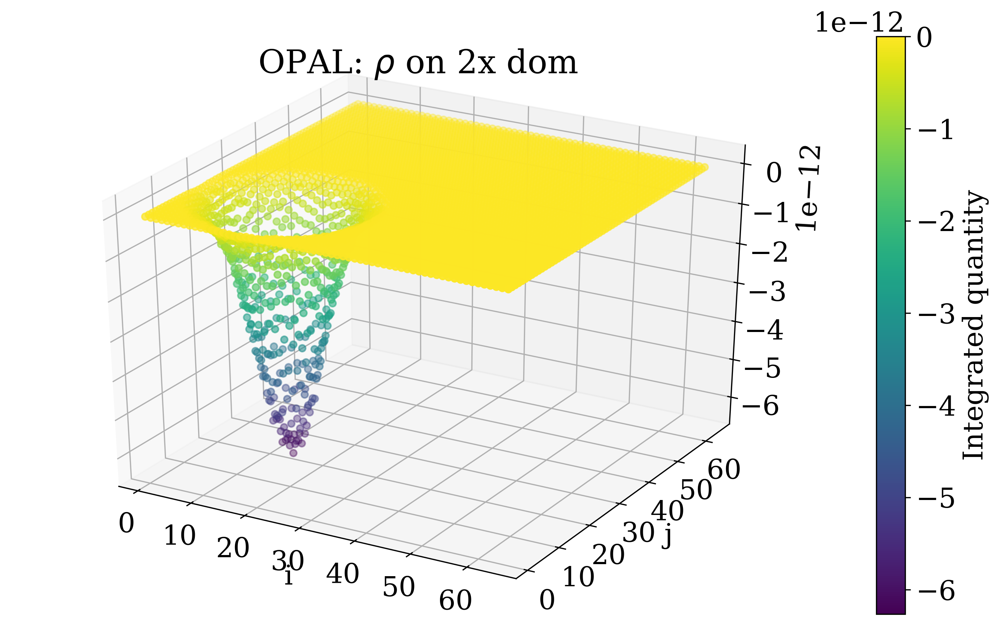

-9.998606566270856e-10


In [8]:
res = visualize_integrated_scalar_field_3d_disc(opalrho2fn, r'OPAL: $\rho$ on 2x dom')
print(res)

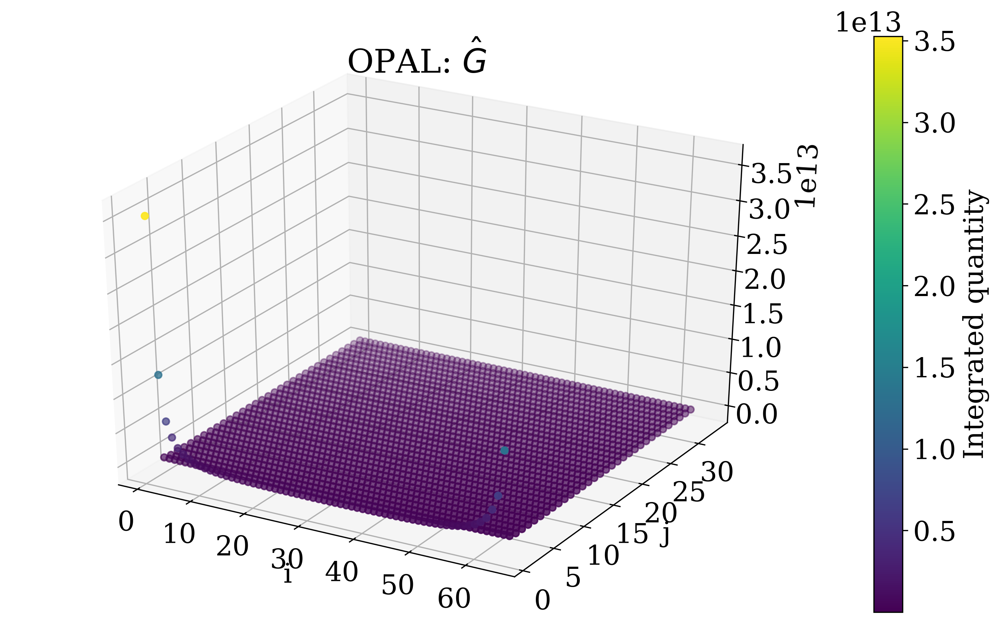

146782531021897.8

In [9]:
visualize_integrated_scalar_field_3d_disc(opalGtrfn, r'OPAL: $\hat G$' )

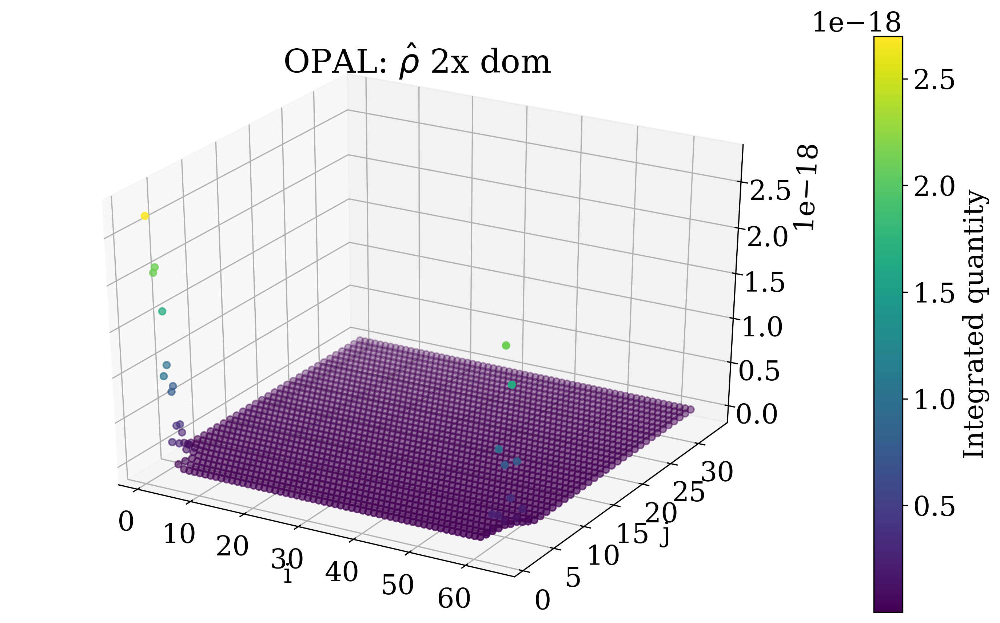

2.2413943503203e-17

In [10]:
visualize_integrated_scalar_field_3d_disc(opalrho2trfn, r'OPAL: $\hat \rho$ 2x dom' )

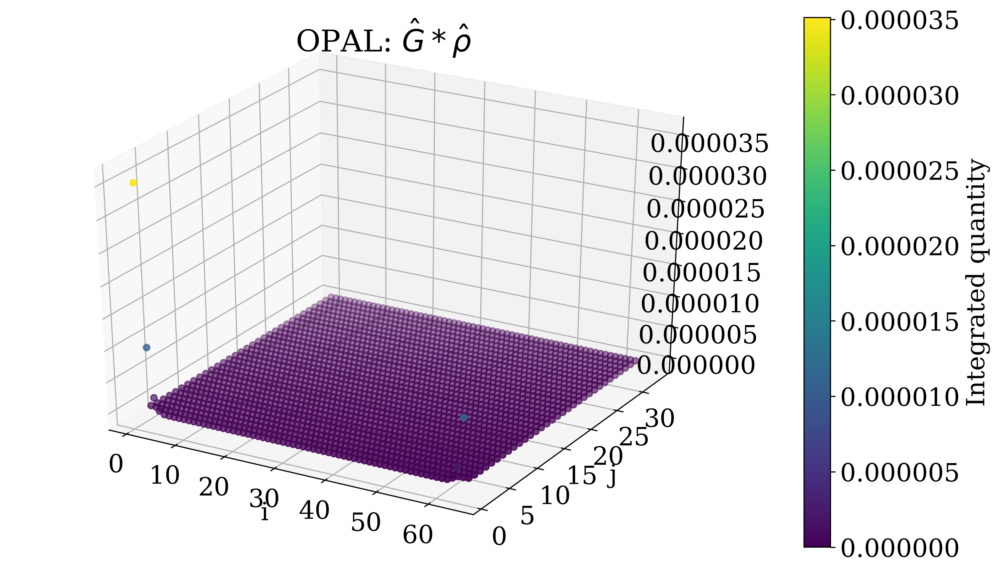

6.20603124039228e-05

In [11]:
visualize_integrated_scalar_field_3d_disc(opalsol2trfn, r'OPAL: $\hat G*\hat \rho$' ) 

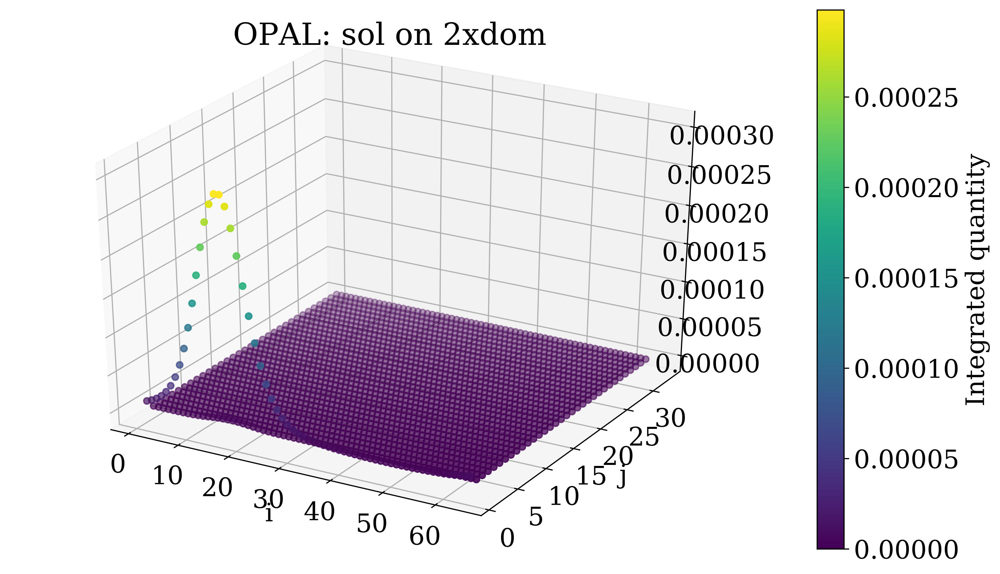

0.003971859991375954

In [12]:
visualize_integrated_scalar_field_3d_disc(opalsol2fn, 'OPAL: sol on 2xdom' )

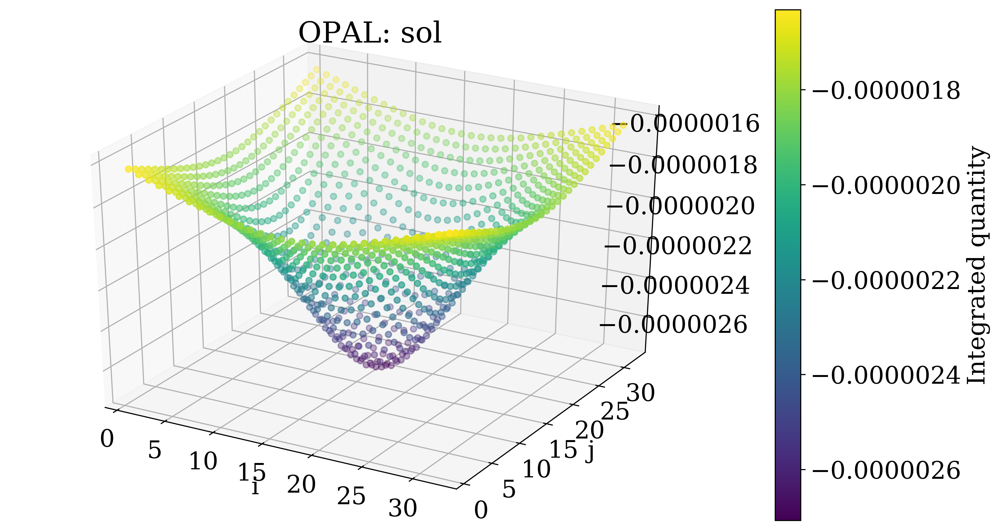

-0.0020622579607998

In [13]:
visualize_integrated_scalar_field_3d_disc(opalsolfn, 'OPAL: sol' )

# OPALX fields

In [14]:
opalxrho      = opalxdir + 'Drift-0-rho_scalar-000000.dat'
opalxrho2     = opalxdir + 'fieldDump-RHO2_scalar-000000.dat'
opalxrho2tr   = opalxdir + 'fieldDump-RHOTR_scalar-000000.dat'
opalxg        = opalxdir + 'fieldDump-G_scalar-000000.dat'

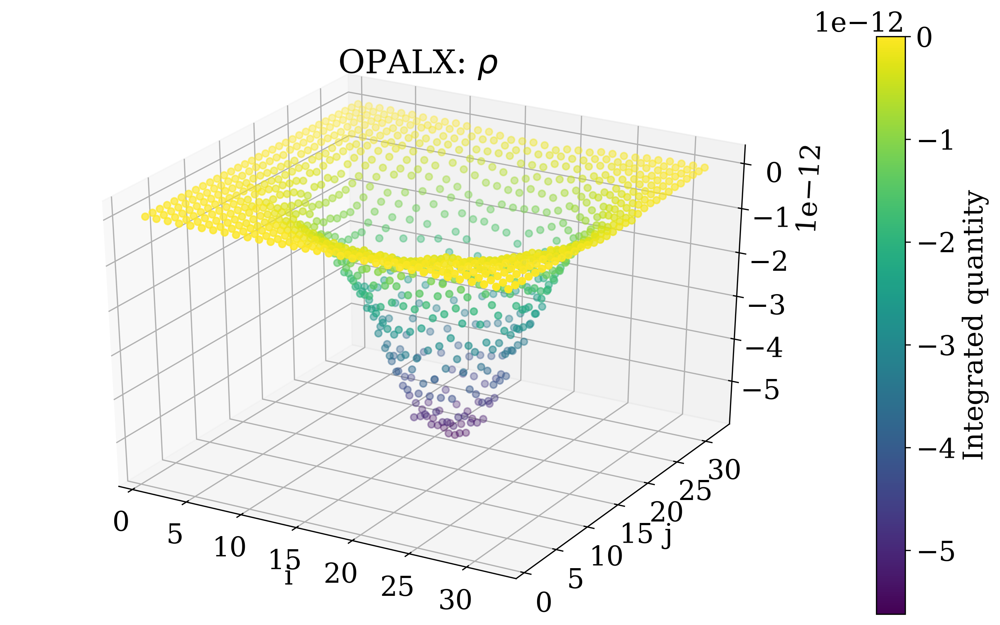

-9.974742659371073e-10


In [15]:
res = visualize_integrated_scalar_field_3d_disc(opalxrho, r'OPALX: $\rho$')
print(res)

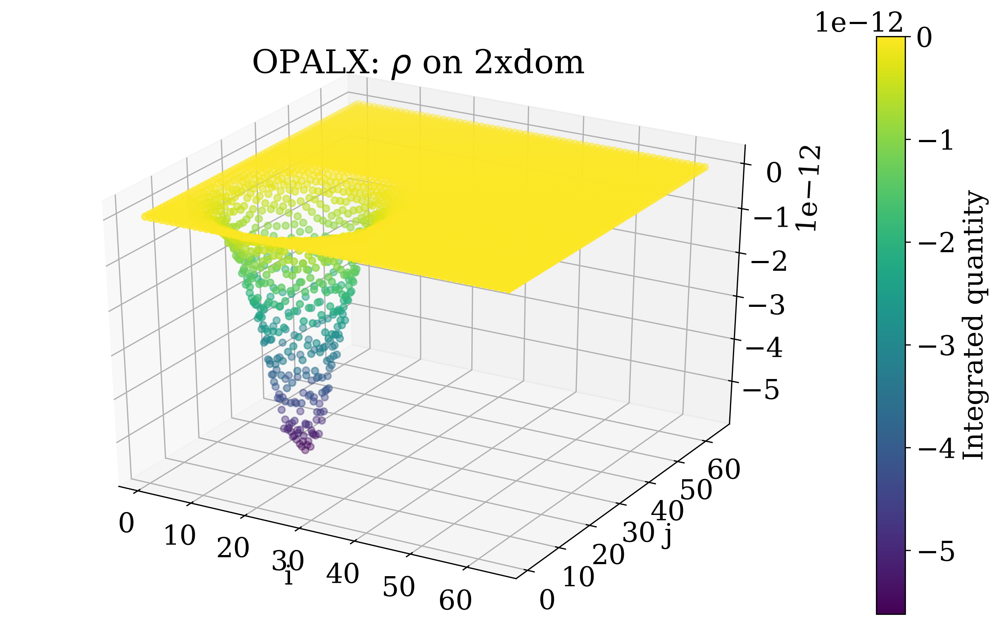

-9.99999999986606e-10


In [16]:
res= visualize_integrated_scalar_field_3d_disc(opalxrho2, r'OPALX: $\rho$ on 2xdom')
print(res)

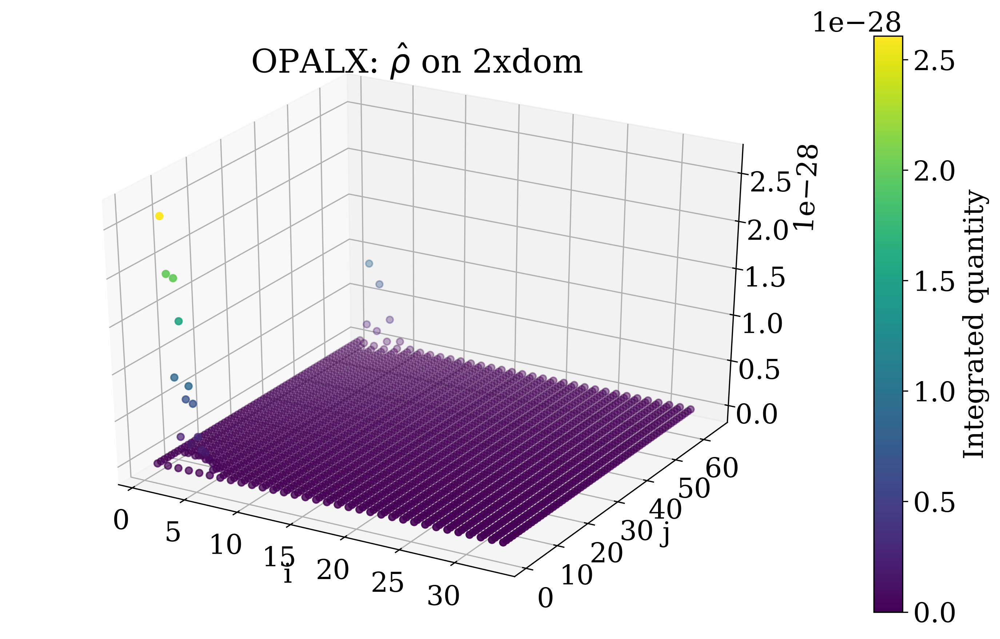

1.5318769289081273e-27


In [17]:
res= visualize_integrated_scalar_field_3d_disc(opalxrho2tr, r'OPALX: $\hat\rho$ on 2xdom')
print(res)

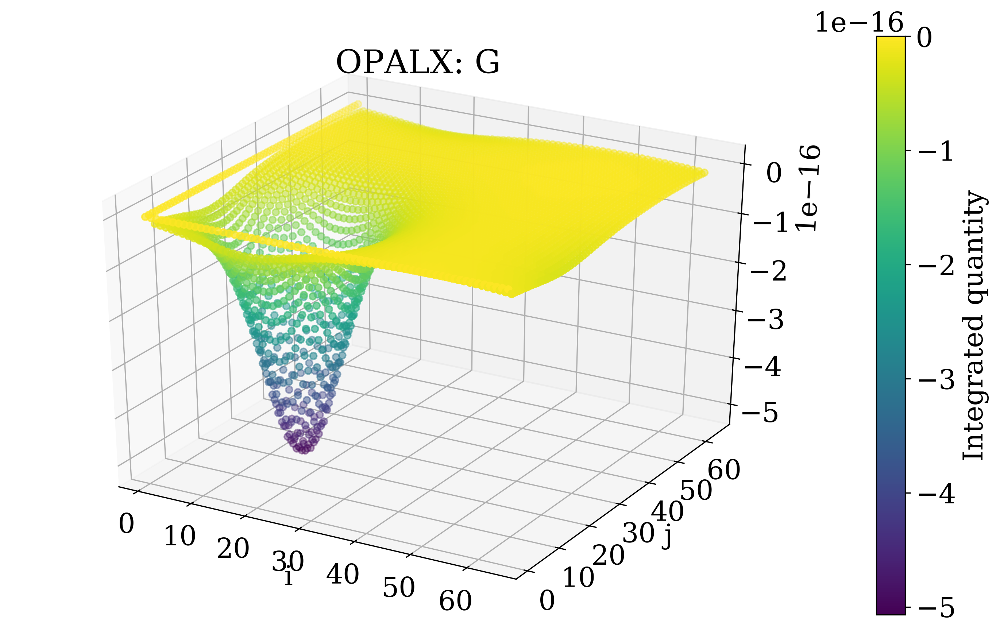

In [18]:
res= visualize_integrated_scalar_field_3d_disc(opalxg, r'OPALX: G')

# Compare origin and meshspacings

In [ ]:
print("OPAL",extract_origin_and_h(opalrhofn))
print("OPALX",extract_origin_and_h(opalxg))
print("OPALX",extract_origin_and_h(opalxrho))
print("OPALX",extract_origin_and_h(opalxrho2))